# Image clustering via neural network encoding

Instead of using skimage to perform any processing deemed relevant, we will be exploring the use of a pre-trained neural network to extract a feature vector from images and cluster the images based on how similar the feature vectors are.

The pre-trained model that we will use is the <b>VGG16 convolutional neural network (CNN)</b>, which is considered to be state-of-the-art for image recognition tasks (see description [here](https://www.mathworks.com/help/deeplearning/ref/vgg16.html;jsessionid=65300a177368086ce3e586b76519)). We are going to be using this model as a feature extractor only, meaning that we will remove the final (prediction) layer so that we can obtain a feature vector.

The case study is the flowers dataset from Kaggle which you can download <a href='https://www.kaggle.com/datasets/olgabelitskaya/flower-color-images' >here</a>. The dataset contains 210 images of 10 different species of flowers that will be downloaded as png files.

In [2]:
# for loading/processing the images  
from keras.utils import load_img 
from keras.utils import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import csv
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

# this list holds all the image filename
capsules= []

# creates a ScandirIterator aliased as files
with open('./data/nespresso/capsule_labels.csv', 'w') as file:
    # create the csv writer
    writer = csv.writer(file)

    writer.writerow(['file','label']) 
    with os.scandir('./data/nespresso/') as dirs:
      # loops through each file in the directory
        for d in dirs:   
            #print(d)
            if d.name!='capsule_labels.csv':                
                dd=os.scandir(d)
                for file in dd:
                    #print(file.name)
                    if file.name.endswith('.JPG'):
                      # adds only the image files to the flowers list

                         #print('./data/nespresso/'+d.name+'/'+file.name)
                         capsules.append('./data/nespresso/'+d.name+'/'+file.name)

                         # write a row to the csv file
                         writer.writerow([file.name,d.name.lower()])  

# view the first 10 flower entries
print(capsules[:10])            


['./data/nespresso/BUENOS_AIRES_LUNGO/_DSC3696 (Large).JPG', './data/nespresso/BUENOS_AIRES_LUNGO/_DSC3697 (Large).JPG', './data/nespresso/BUENOS_AIRES_LUNGO/_DSC3698 (Large).JPG', './data/nespresso/BUENOS_AIRES_LUNGO/_DSC3699 (Large).JPG', './data/nespresso/BUENOS_AIRES_LUNGO/_DSC3700 (Large).JPG', './data/nespresso/BUENOS_AIRES_LUNGO/_DSC3701 (Large).JPG', './data/nespresso/BUENOS_AIRES_LUNGO/_DSC3702 (Large).JPG', './data/nespresso/BUENOS_AIRES_LUNGO/_DSC3703 (Large).JPG', './data/nespresso/BUENOS_AIRES_LUNGO/_DSC3704 (Large).JPG', './data/nespresso/BUENOS_AIRES_LUNGO/_DSC3731 (Large).JPG']


## Data Preprocessing

This is where we put the load_img() and preprocess_input() methods to use. When loading the images we are going to set the target size to (224, 224) because the VGG model expects the images it receives to be 224x224 NumPy arrays. 

In [3]:
# load the image as a 224x224 array
img = load_img(capsules[0], target_size=(224,224,3))
# convert from 'PIL.Image.Image' to numpy array
img = np.array(img)

print(img.shape)


(224, 224, 3)


Currently, our array has only 3 dimensions (rows, columns, channels) and the model operates in batches of samples. So we need to expand our array to add the dimension that will let the model know how many images we are giving it (num_of_samples, rows, columns, channels).

In [4]:
"""
Number of dimensions: 4 
Number of images (batch size): 1 
Number of rows (0th axis): 224 
Number of columns (1st axis): 224 
Number of channels (rgb): 3
"""
reshaped_img = img.reshape(1,224,224,3)
print(reshaped_img.shape)

(1, 224, 224, 3)


The last step is to pass the reshaped array to the preprocess_input method and our image is ready to be loaded into the model.

In [5]:
imgx = preprocess_input(reshaped_img)

## The Model

Now we can load the VGG model and remove the output layer manually. This means that the new final layer is a fully-connected layer with 4,096 output nodes. This vector of 4,096 numbers is the feature vector that we will use to cluster the images. 

In [6]:
# load model
model = VGG16()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

Now that the final layer is removed, we can pass our image through the predict method to get our feature vector.

In [7]:
# get the feature vector
#features = model.predict(imgx, use_multiprocessing=True)
features = model.predict(imgx)

print(features.shape)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step
(1, 4096)


We are now going to refactor the above code so that we have a feature_extraction function that we can use to extract the features from all of the images.

In [8]:
# load the model first and pass as an argument
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    #features = model.predict(imgx, use_multiprocessing=True)
    features = model.predict(imgx)
    return features

Let's extract the features from all of the images and store them in a dictionary with the filename as the keys.

In [9]:
data = {}

# loop through each image in the dataset
for capsule in capsules:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(capsule,model)
        data[capsule] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open("./data/nespresso/capsules.pkl",'wb') as file:
            pickle.dump(data,file)
          
 
# get a list of the filenames
filenames = np.array(list(data.keys()))

# get a list of just the features
feat = np.array(list(data.values()))
print(feat.shape)

# reshape so that there are 210 samples of 4096 vectors
feat = feat.reshape(-1,4096)
print(feat.shape)

df = pd.read_csv('./data/nespresso/capsule_labels.csv')
label = df['label'].tolist()
unique_labels = list(set(label))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 654ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

## Dimensionality Reduction (PCA)

Since the feature vector has over 4,000 dimensions, for computation's sake, we should reduce the number of dimensions from 4,000 to a smaller number. We cannot simply  shorten the list by slicing it or using some subset of it because we will lose information. 

The key to reduce the dimensionality while keeping as much information as possible is to apply <b>principle component analysis</b> (see a brief description <a href='https://towardsdatascience.com/a-one-stop-shop-for-principal-component-analysis-5582fb7e0a9c'>here</a>). Simply put, if you are working with data and have a lot of variables to consider (in our case 4096), PCA allows you to reduce the number of variables while preserving as much information from the original set as possible.

The number of dimensions to reduce down to is up to you and there are methods for finding the best number of components to use, but for this case study, we will choose 100 as an arbitrary number.

In [10]:
pca = PCA(n_components=100, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

print(f"Components before PCA: {feat.shape[1]}")
print(f"Components after PCA: {pca.n_components}")

Components before PCA: 4096
Components after PCA: 100


## KMeans clustering

You need to define a target number k, which refers to the number of centroids for the clustering model. A centroid is the imaginary or real location representing the center of the cluster.

This algorithm will allow us to group our feature vectors into k clusters. Each cluster should contain images that are visually similar. In this case, we know there are 10 different species of flowers so we can set k = 10.

In [11]:
# setting the same value for the random state is important in orer to obtain similar results
kmeans = KMeans(n_clusters=len(unique_labels), random_state=22, n_init=10)
kmeans.fit(x)

print(kmeans.labels_)

[ 0  9  9 ... 12  5  0]


Each label in this list is a cluster identifier for each image in our dataset. The order of the labels is parallel to the list of filenames for each image. This way we can group the images into their clusters.

In [12]:
# holds the cluster id and the images { id: [images] }
groups = {}

for file, cluster in zip(filenames,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

For example, let's look into the images in cluster 1: 

In [13]:
# view the filenames in cluster 1
print(groups[1])

[np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2817 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2818 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2819 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2820 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2824 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2825 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2826 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2827 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2870 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2871 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2872 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2873 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2878 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DSC2879 (Large).JPG'), np.str_('./data/nespresso/ISTANBUL_ESPRESSO/_DS

All we have left to do is to view a cluster to see how well our model did by inspecting the clusters.

In [14]:
# function that lets you view a cluster (based on identifier)        
def view_cluster(cluster):
    plt.figure(figsize = (25,25));
    # gets the list of filenames for a cluster
    files = groups[cluster]
    # only allow up to 30 images to be shown at a time
    if len(files) > 30:
        print(f"Clipping cluster size from {len(files)} to 30")
        files = files[:29]
    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(10,10,index+1);
        img = load_img(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

Clipping cluster size from 76 to 30
Clipping cluster size from 48 to 30
Clipping cluster size from 96 to 30
Clipping cluster size from 88 to 30
Clipping cluster size from 95 to 30
Clipping cluster size from 63 to 30
Clipping cluster size from 46 to 30
Clipping cluster size from 48 to 30
Clipping cluster size from 44 to 30
Clipping cluster size from 92 to 30


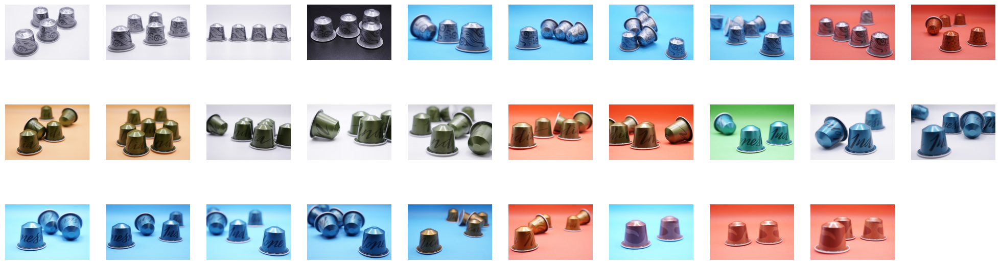

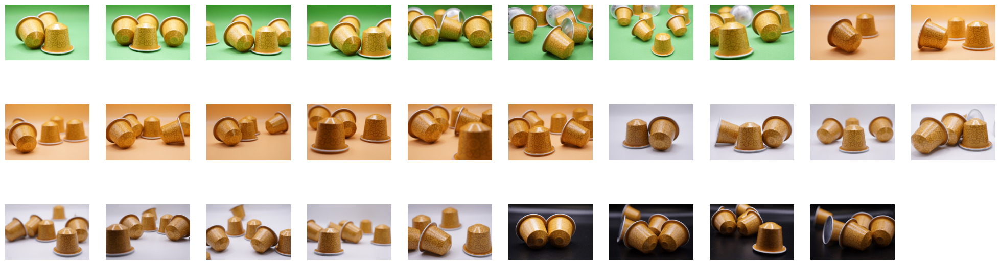

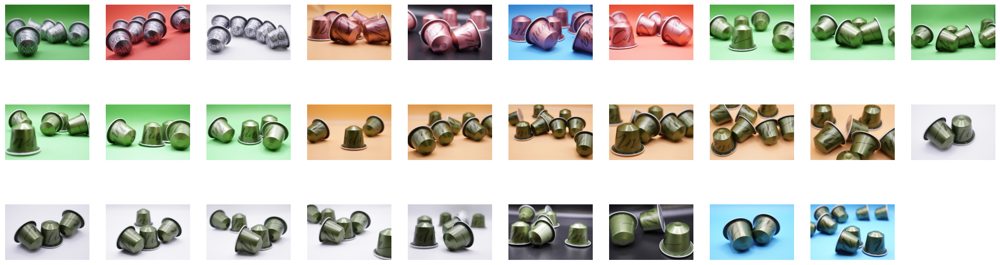

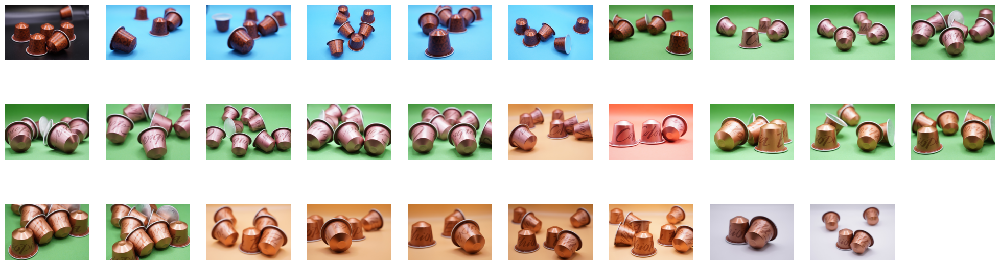

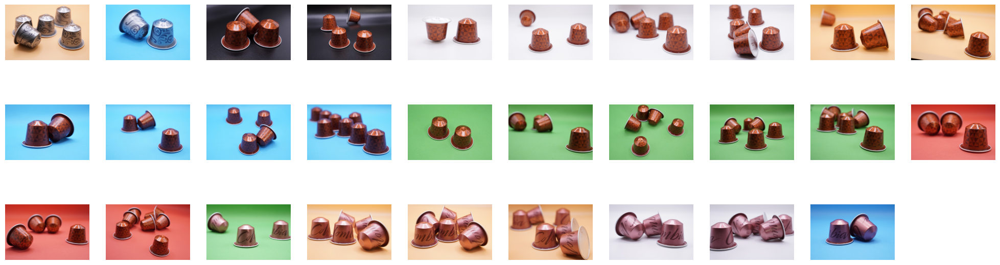

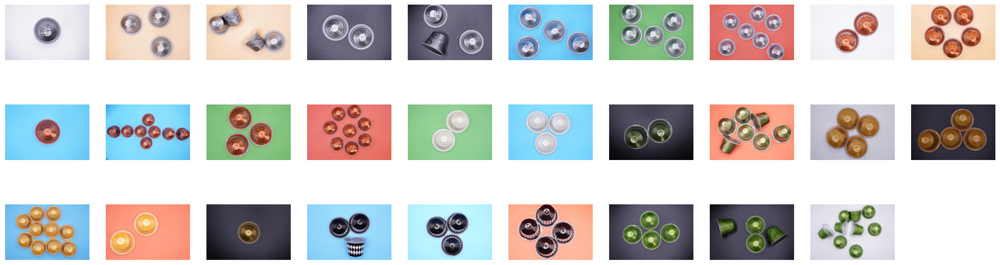

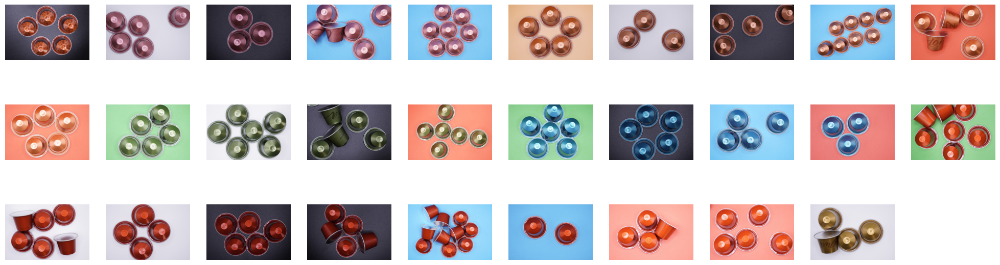

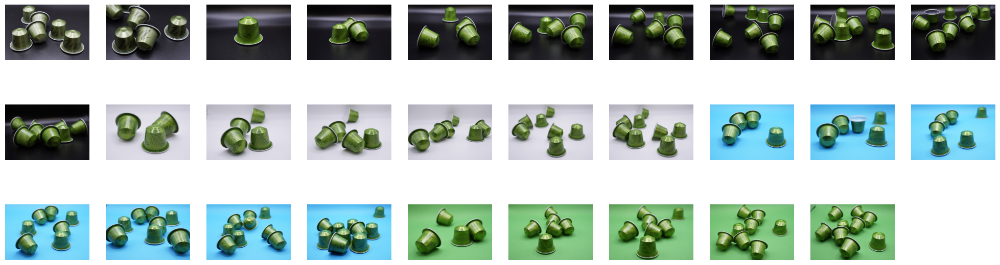

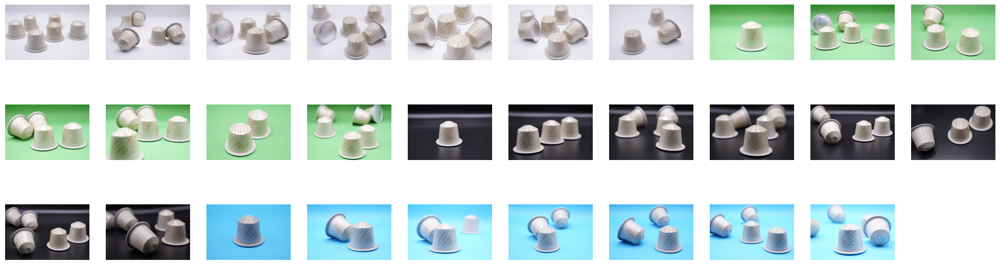

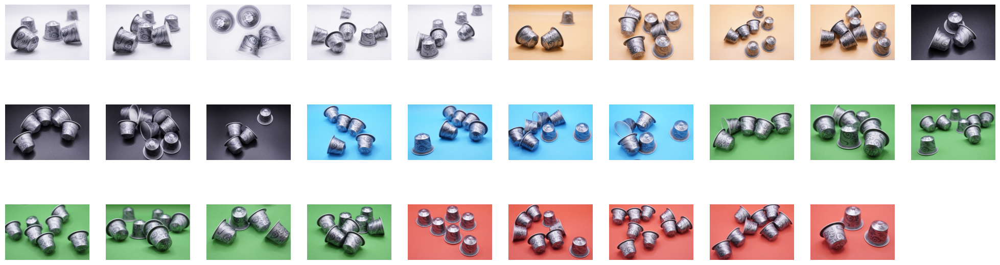

In [15]:
for cluster in range (0,10):
    view_cluster(cluster)

We can observe that our model did well on clustering the flower images. We can identify the "missplaced" images. We can also see that some clusters flowers with similar colouring, but the type of flowers in each cluster are different species.

As a final step of this analysis, we are going to calculate the sum of squared errors while building the clustering model and thus, determine the best value k for the present dataset.

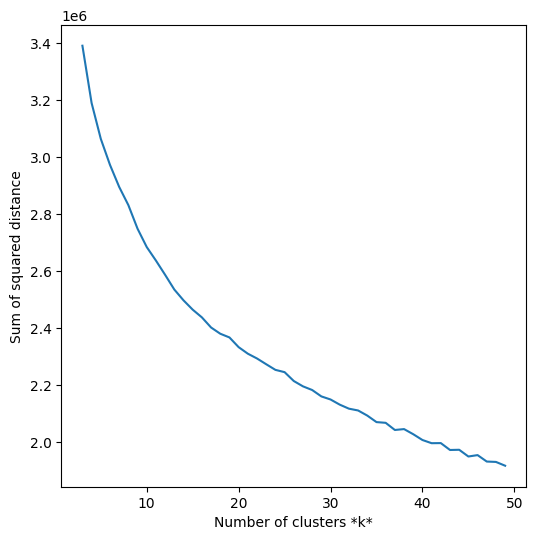

In [16]:
# this is just incase you want to see which value for k might be the best 
sse = []
list_k = list(range(3, 50))

for k in list_k:
    km = KMeans(n_clusters=k, random_state=22, n_init=10)
    km.fit(x)
    
    sse.append(km.inertia_)

# Plot sse against k
plt.figure(figsize=(6, 6))
plt.plot(list_k, sse)
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance');